In [1]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
aryansinghal10_alzheimers_multiclass_dataset_equal_and_augmented_path = kagglehub.dataset_download(
    'aryansinghal10/alzheimers-multiclass-dataset-equal-and-augmented')

print('Data source import complete.')


/home/pirahna/projects/data_science/BrainyScan/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Data source import complete.


In [4]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
from imblearn.over_sampling import SMOTE

In [5]:
print(aryansinghal10_alzheimers_multiclass_dataset_equal_and_augmented_path)


/home/pirahna/.cache/kagglehub/datasets/aryansinghal10/alzheimers-multiclass-dataset-equal-and-augmented/versions/1


In [6]:
images = []
labels = []

dataset_dir = aryansinghal10_alzheimers_multiclass_dataset_equal_and_augmented_path

for subfolder in tqdm(os.listdir(dataset_dir)):
    subfolder_path = os.path.join(dataset_dir, subfolder)
    for folder in os.listdir(subfolder_path):
        subfolder_path2=os.path.join(subfolder_path,folder)
        for image_filename in os.listdir(subfolder_path2):
            image_path = os.path.join(subfolder_path2, image_filename)
            images.append(image_path)
            labels.append(folder)
df = pd.DataFrame({'image': images, 'label': labels})
df

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


,image,label
0,/home/pirahna/.cache/kagglehub/datasets/aryans...,VeryMildDemented
1,/home/pirahna/.cache/kagglehub/datasets/aryans...,VeryMildDemented
2,/home/pirahna/.cache/kagglehub/datasets/aryans...,VeryMildDemented
3,/home/pirahna/.cache/kagglehub/datasets/aryans...,VeryMildDemented
4,/home/pirahna/.cache/kagglehub/datasets/aryans...,VeryMildDemented
...,...,...
43995,/home/pirahna/.cache/kagglehub/datasets/aryans...,ModerateDemented
43996,/home/pirahna/.cache/kagglehub/datasets/aryans...,ModerateDemented
43997,/home/pirahna/.cache/kagglehub/datasets/aryans...,ModerateDemented
43998,/home/pirahna/.cache/kagglehub/datasets/aryans...,ModerateDemented


Exact counts for each class:
label
NonDemented         12800
VeryMildDemented    11200
MildDemented        10000
ModerateDemented    10000
Name: count, dtype: int64


/tmp/ipykernel_25728/2171261365.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.countplot(x=df['label'], palette='Set1')


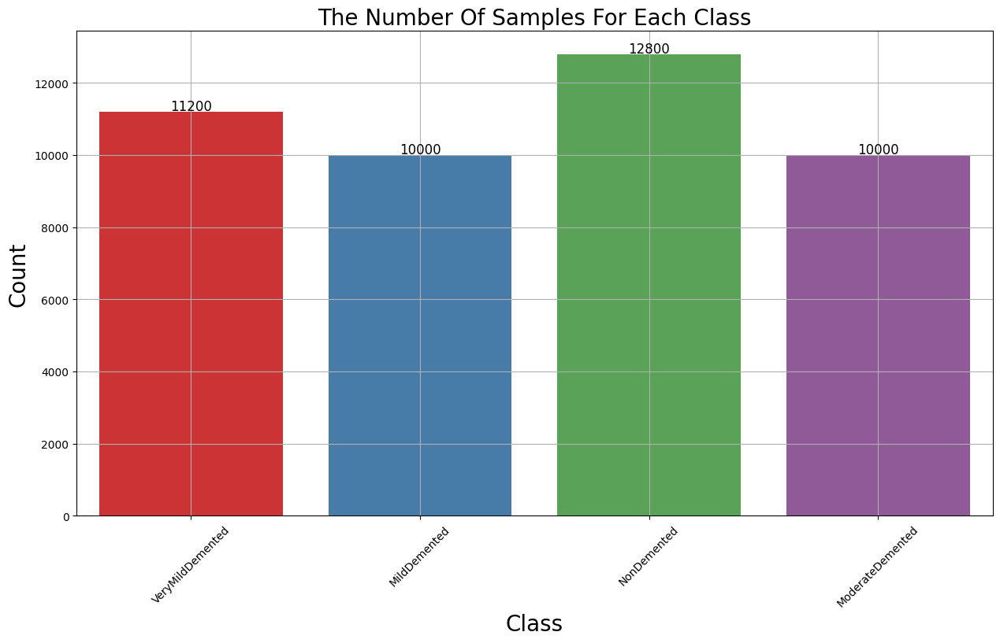

In [7]:
# Assuming `df` is your DataFrame and `label` is the column with class labels
class_counts = df['label'].value_counts()

# Print exact counts
print("Exact counts for each class:")
print(class_counts)

# Plot the class distribution
plt.figure(figsize=(15, 8))
ax = sns.countplot(x=df['label'], palette='Set1')
ax.set_xlabel("Class", fontsize=20)
ax.set_ylabel("Count", fontsize=20)
plt.title('The Number Of Samples For Each Class', fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)

# Annotate each bar with the exact count
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black', xytext=(0, 5),
                textcoords='offset points')

plt.show()

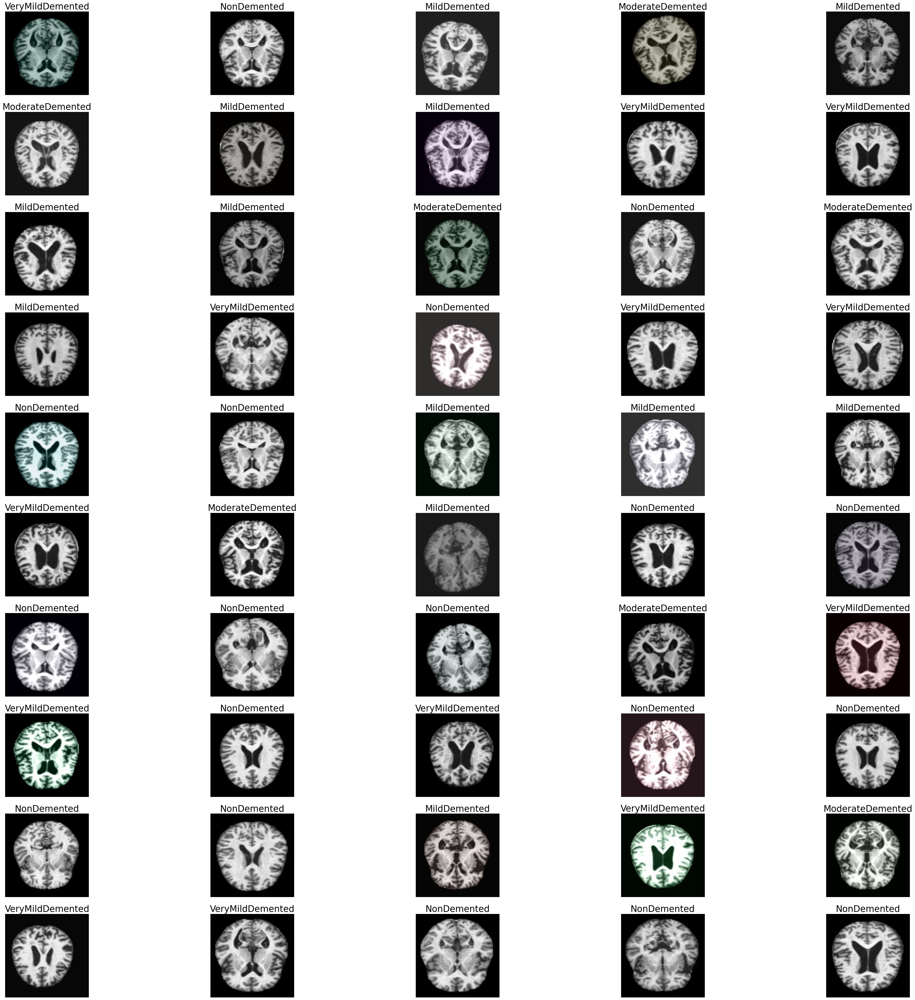

In [8]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(df),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=25)

In [9]:
X_data, _, y_data, _ = train_test_split(df['image'], df['label'], test_size=0.9, random_state=42, shuffle=True, stratify=df['label'])

print(X_data.shape)
print(y_data.shape)

(4400,)
(4400,)


In [11]:
print(X_train.shape)
#, X_test1, y_train, y_test1, X_val, X_test, y_val, y_test

NameError: name 'X_train' is not defined

In [12]:
X_train, X_test1, y_train, y_test1 = train_test_split(
    X_data, y_data, test_size=0.2, random_state=42,shuffle=True, stratify = y_data)

X_val, X_test, y_val, y_test = train_test_split(
    X_test1, y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)

df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})

In [13]:
image_size = (224,224)
batch_size = 32
datagen = ImageDataGenerator(
    preprocessing_function= tf.keras.applications.resnet.preprocess_input,
    rescale=1./255,
    horizontal_flip=True
)
train_generator = datagen.flow_from_dataframe(
    df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)
test_generator = datagen.flow_from_dataframe(
    df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)
val_generator = datagen.flow_from_dataframe(
    df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

Found 3520 validated image filenames belonging to 4 classes.
Found 440 validated image filenames belonging to 4 classes.
Found 440 validated image filenames belonging to 4 classes.


In [14]:
class_num=list(train_generator.class_indices.keys())
class_num

['MildDemented', 'ModerateDemented', 'NonDemented', 'VeryMildDemented']

In [15]:
import tensorflow as tf
from tensorflow import keras

model = keras.models.Sequential()
model.add(tf.keras.applications.VGG16(input_shape=(224, 224, 3), include_top=False, pooling='avg', weights='imagenet'))
model.add(keras.layers.Flatten())
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Dense(2048, activation='relu'))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Dense(1024, activation='relu'))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Dense(4, activation='softmax'))
model.layers[0].trainable = False

# Build the model with the correct input shape
model.build(input_shape=(None, 224, 224, 3))
model.summary()

2025-05-26 17:57:24.511388: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 10s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 512)            │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2048)           │     1,050,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,881,924 (68.21 MB)

 Trainable params: 3,160,068 (12.05 MB)

 Non-trainable params: 14,721,856 (56.16 MB)

In [17]:
checkpoint_cb = ModelCheckpoint("model_VGG16.keras", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=10, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist = model.fit(train_generator, epochs=50, validation_data=val_generator, callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 326s 3s/step - accuracy: 0.5826 - loss: 1.5158 - val_accuracy: 0.2977 - val_loss: 1.5868
Epoch 2/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 336s 3s/step - accuracy: 0.7649 - loss: 0.5751 - val_accuracy: 0.3682 - val_loss: 1.4906
Epoch 3/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 335s 3s/step - accuracy: 0.8156 - loss: 0.4665 - val_accuracy: 0.6068 - val_loss: 0.8998
Epoch 4/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 335s 3s/step - accuracy: 0.8662 - loss: 0.3534 - val_accuracy: 0.6864 - val_loss: 0.8016
Epoch 5/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 338s 3s/step - accuracy: 0.8843 - loss: 0.2925 - val_accuracy: 0.7500 - val_loss: 0.6507
Epoch 6/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 338s 3s/step - accuracy: 0.9004 - loss: 0.2667 - val_accuracy: 0.7614 - val_loss: 0.7545
Epoch 7/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 337s 3s/step - accuracy: 0.9126 - loss: 0.2448 - val_accuracy: 0.8091 - val_loss: 0.5875
Epoch 8/50
110/110 ━━━━━━━━━━━━━━━━━━━━ 326s 3s/step - accuracy: 0.9419 - loss: 0.1571 - val_accu

I have a bad feeling, that 40 min it is only one epoch of 50 ))

In [19]:
model.save('../models/model_VGG16.keras')
model.export('../models/model_VGG16')

INFO:tensorflow:Assets written to: ../models/model_VGG16/assets


INFO:tensorflow:Assets written to: ../models/model_VGG16/assets


Saved artifact at '../models/model_VGG16'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_20')
Output Type:
  TensorSpec(shape=(None, 4), dtype=tf.float32, name=None)
Captures:
  139666600634576: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139666600634768: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139666600635152: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139666600633616: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139666600636880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139666600635920: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139666600636496: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139666600636112: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139666600634192: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139666600636304: TensorSpec(shape=(), dtype=tf.resource, name=None)
  139666

In [20]:
import os
print(os.listdir('../models'))

['.gitkeep', 'model_VGG16.keras', 'model_VGG16']


In [21]:
hist_=pd.DataFrame(hist.history)
hist_

,accuracy,loss,val_accuracy,val_loss
0,0.630114,1.131134,0.297727,1.586807
1,0.759091,0.601138,0.368182,1.490643
2,0.813920,0.474668,0.606818,0.899750
3,0.851420,0.398118,0.686364,0.801587
4,0.871875,0.326703,0.750000,0.650683
5,0.887500,0.290647,0.761364,0.754521
6,0.906818,0.254034,0.809091,0.587517
7,0.934943,0.174917,0.804545,0.643867
8,0.928125,0.212665,0.806818,0.620528
9,0.935795,0.167377,0.829545,0.517458


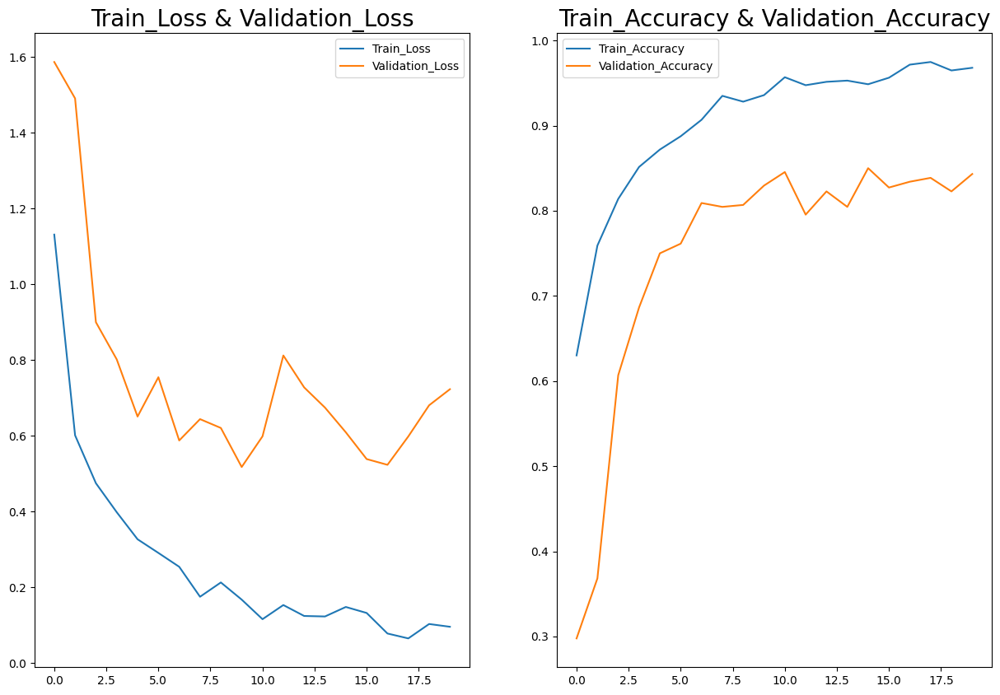

In [22]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.show()

In [23]:
score, acc= model.evaluate(test_generator)
print('Val Loss =', score)
print('Val Accuracy =', acc)

/home/pirahna/projects/data_science/BrainyScan/.venv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


14/14 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step - accuracy: 0.8483 - loss: 0.5092
Val Loss = 0.5447396039962769
Val Accuracy = 0.8522727489471436


In [24]:
y_test =test_generator.classes
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions,axis=1)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
df

14/14 ━━━━━━━━━━━━━━━━━━━━ 29s 2s/step


,Actual,Prediction
0,1,1
1,2,2
2,2,2
3,3,3
4,1,1
...,...,...
435,2,2
436,0,0
437,1,1
438,2,2


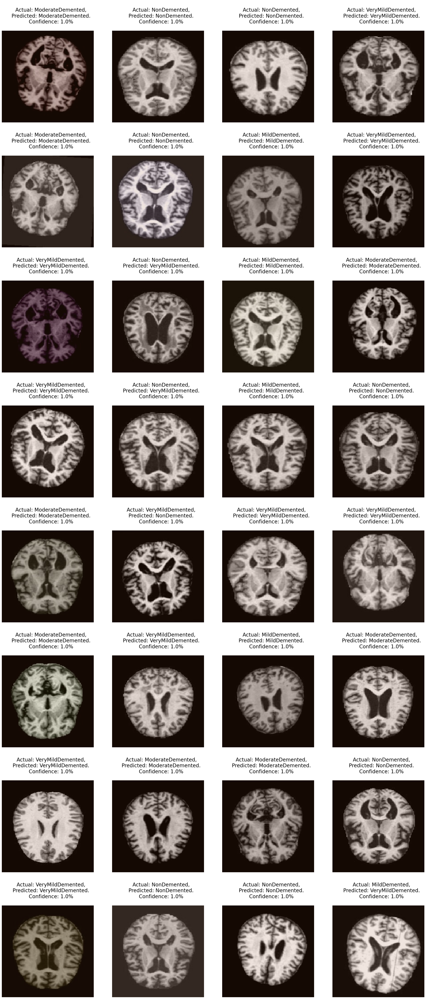

In [40]:
plt.figure(figsize=(30,70))
batch = next(test_generator)
images= batch[0]
# dummy normalization
images = ((images + 0.5) * 220).astype(np.uint8)

for n in range(32):
    plt.subplot(8,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(f'''
    Actual: {class_num[y_test[n]]},
    Predicted: {class_num[y_pred[n]]}.
    Confidence: {
        round(predictions[n][ np.argmax(predictions[n]) ],0)}%
    ''',
    fontsize=20)

array([[88,  0,  5,  7],
       [ 0, 99,  1,  0],
       [10,  1, 93, 24],
       [10,  1, 10, 91]])

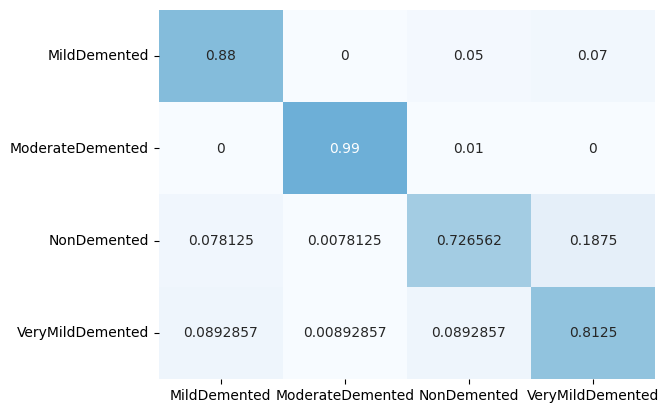

In [41]:
CM = confusion_matrix(y_test,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues',xticklabels=class_num, yticklabels=class_num)
CM

In [42]:
ClassificationReport = classification_report(y_test,y_pred,target_names=class_num)
print('Classification Report is : ', ClassificationReport)

Classification Report is :                    precision    recall  f1-score   support

    MildDemented       0.81      0.88      0.85       100
ModerateDemented       0.98      0.99      0.99       100
     NonDemented       0.85      0.73      0.78       128
VeryMildDemented       0.75      0.81      0.78       112

        accuracy                           0.84       440
       macro avg       0.85      0.85      0.85       440
    weighted avg       0.85      0.84      0.84       440



In [43]:
class_num=list(train_generator.class_indices.keys())
class_num

['MildDemented', 'ModerateDemented', 'NonDemented', 'VeryMildDemented']

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step


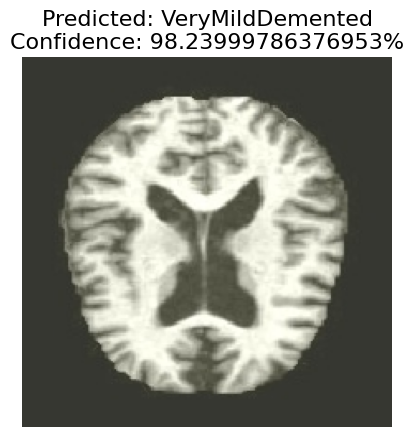

In [48]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

def predict_single_image(model, image_path, class_num, target_size=(224, 224)):
    """
    Predicts the class of a single image and displays it with the prediction and confidence.

    Args:
        model: Trained Keras model.
        image_path (str): Path to the image file.
        class_num (dict): Dictionary mapping class indices to class labels.
        target_size (tuple): Target size for resizing the image.
    """
    # Load and preprocess the image
    image = load_img(image_path, target_size=target_size)
    image_array = img_to_array(image)  # Convert to numpy array
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension
    image_array = image_array / 255.0  # Normalize

    # Predict
    predictions = model.predict(image_array)
    predicted_class_index = np.argmax(predictions)
    predicted_class_label = class_num[predicted_class_index]
    confidence = round(np.max(predictions) * 100, 2)

    # Display the image and prediction
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Predicted: {predicted_class_label}\nConfidence: {confidence}%", fontsize=16)
    plt.show()

# Example Usage
image_path = os.path.join(dataset_dir, 'combined_images/VeryMildDemented/0073c8fe-469d-4160-9344-37d61ac6f9bd.jpg')
class_num = {0: 'MildDemented', 1: 'ModerateDemented', 2: 'NonDemented', 3: 'VeryMildDemented'}
predict_single_image(model, image_path, class_num)
